In [14]:
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import os
import shutil
import time
import random
from pruner.concepts import concepts

PATH='tmp/'
LABEL='imagenet1k_labels.txt'
SEED=1
COVERAGE=0.75
random.seed(SEED)

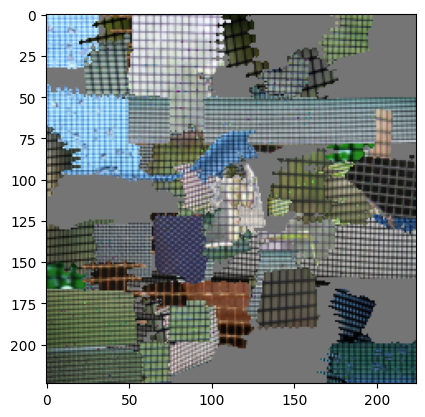

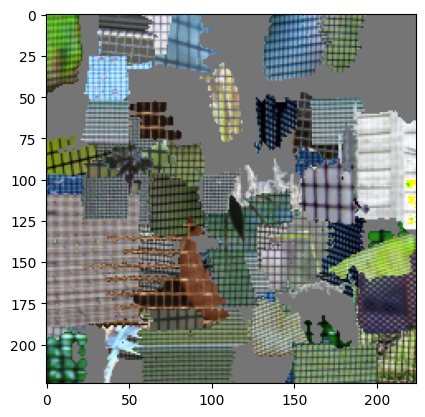

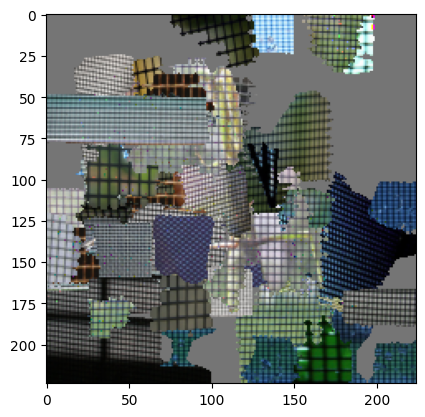

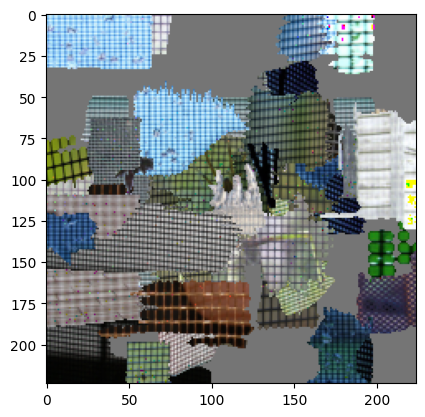

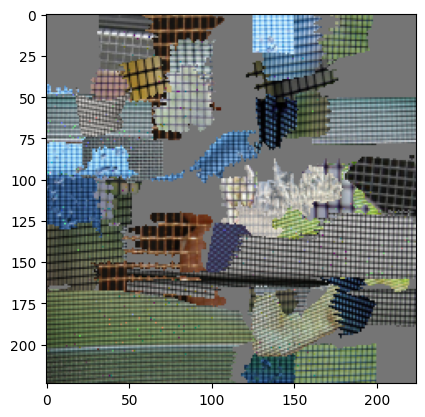

...

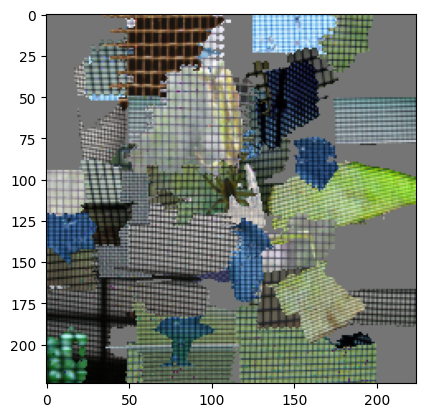

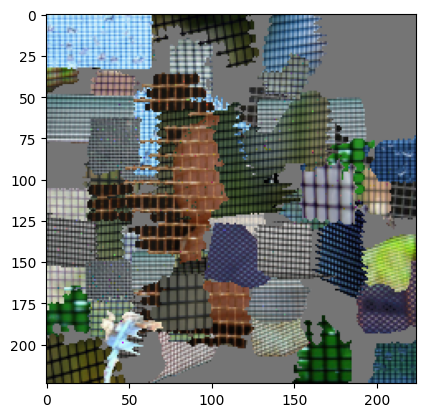

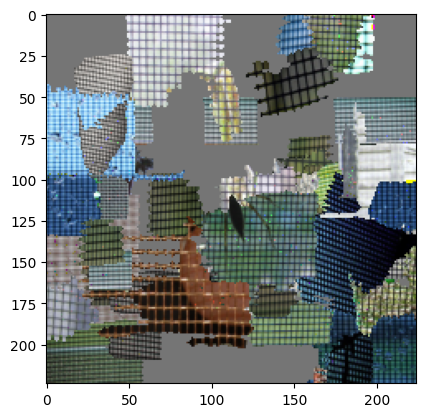

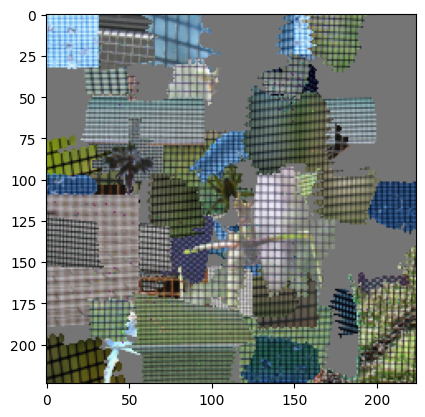

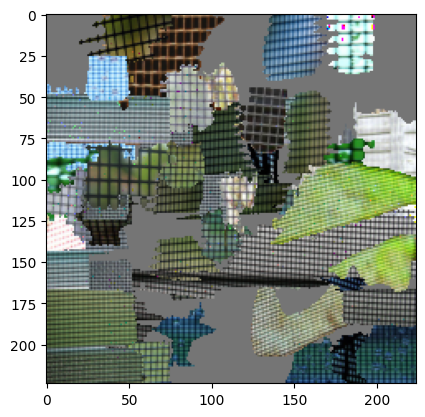

([<PIL.Image.Image image mode=RGB size=224x224>,
  <PIL.Image.Image image mode=RGB size=224x224>,
  <PIL.Image.Image image mode=RGB size=224x224>,
  <PIL.Image.Image image mode=RGB size=224x224>,
  <PIL.Image.Image image mode=RGB size=224x224>,
  <PIL.Image.Image image mode=RGB size=224x224>,
  <PIL.Image.Image image mode=RGB size=224x224>,
  <PIL.Image.Image image mode=RGB size=224x224>,
  <PIL.Image.Image image mode=RGB size=224x224>,
  <PIL.Image.Image image mode=RGB size=224x224>,
  <PIL.Image.Image image mode=RGB size=224x224>,
  <PIL.Image.Image image mode=RGB size=224x224>,
  <PIL.Image.Image image mode=RGB size=224x224>,
  <PIL.Image.Image image mode=RGB size=224x224>,
  <PIL.Image.Image image mode=RGB size=224x224>,
  <PIL.Image.Image image mode=RGB size=224x224>,
  <PIL.Image.Image image mode=RGB size=224x224>,
  <PIL.Image.Image image mode=RGB size=224x224>,
  <PIL.Image.Image image mode=RGB size=224x224>,
  <PIL.Image.Image image mode=RGB size=224x224>,
  <PIL.Image.Image i

In [15]:
class stitching_concept(concepts):
    def __init__(self,working_dir,label):
        super (stitching_concept, self).__init__(working_dir,label)
    
    def mkdir(self,path):
        if os.path.exists(path):
            shutil.rmtree(path)
            os.makedirs(path)
        else:
            os.makedirs(path)

    def get_stitching_concept(self,num_class,num_in_each_class):
        dict=self.get_ACE_results()
        img=[]
        y=[]
        for k,v in dict.items():
            for i in range(num_class):
                tempx,tempy=self.stitching_homo_concept(k,i,num_in_each_class)
                img+=tempx
                y+=tempy
        return img,y


    def show_img(self,img):
        plt.figure("stitching")
        plt.imshow(img)
        plt.show()

    def isCoverage(self,x,rate):
        if type(x) is not np.ndarray:
            return False
        a=np.sum(x==117)/float(x.size)
        if (1-(np.sum(x==117)/float(x.size)))>rate:
            return True
        else:
            return False

    def get_concept_dict(self,dict,label_name):
        concept_dict={}
        for idx,each in enumerate(dict[label_name]):
            concept_dict[str(idx)]=self.get_concept_patches(label_name,each['name']+"_patches")
        return concept_dict

    def stitching_diff_concept(self,label_name,num_of_output,if_show=False):
        dict = self.get_ACE_results()
        labels = self.get_labels()
        selected = {}
        res=[]
        x=None
        concept_dict={}

        for _ in range(num_of_output):
            x=None
            while(not self.isCoverage(x,COVERAGE)):
                if len(concept_dict)==0 or len(concept_dict["0"])==0:
                    concept_dict=self.get_concept_dict(dict,label_name)
                for inv_idx in sorted(concept_dict,reverse=True):
                    img=Image.open(concept_dict[inv_idx].pop(random.randrange(len(concept_dict[inv_idx]))))
                    pix = np.array(img)
                    if x is None:
                        x=pix
                    else:
                        x[pix!=117]=pix[pix!=117]
            res.append(x)

        for i in range(len(res)):
            res[i]=Image.fromarray(res[i])
            if if_show:
                 plt.figure("stitching")
                 plt.imshow( res[i])
                 plt.show()
        for idx, label in enumerate(labels):
            if label == label_name:
                y = [idx] * len(res)
        return res,y


c=stitching_concept(PATH,LABEL)
c.stitching_diff_concept("n04589890",30,True)
